In [88]:
from pathlib import Path

import pandas as pd
import numpy as np

import networkx as nx

import matplotlib.pyplot as plt

import geopandas as gpd
import contextily as ctx


In [89]:
BASE_DIR = Path(".")
DATA_DIR = BASE_DIR / "Data"

DATA_FILE = DATA_DIR / "final_trip_data.parquet"

padding = 2800


In [90]:
trip_data = pd.read_parquet(DATA_FILE)
trip_data.head()

,trip_id,start_date,start_station_id,start_station_name,end_date,end_station_id,end_station_name,bike_id,bike_model,total_duration,total_duration_ms,start_lat,start_lon,end_lat,end_lon
0,136666627,2024-01-14 23:59:00,1108,"North Wharf Road, Paddington",2024-01-15 00:06:00,3423.0,"Maida Vale, Maida Vale",53020.0,CLASSIC,6m 47s,407799.0,51.518623,-0.17660300000000007,51.529857,-0.18348604
1,136666625,2024-01-14 23:57:00,3447,"Gloucester Road (North), Kensington",2024-01-15 00:05:00,1214.0,"Kensington Olympia Station, Olympia",54559.0,CLASSIC,8m 1s,481276.0,51.49792478,-0.183834706,51.49815779,-0.209494128
2,136666626,2024-01-14 23:57:00,1090,"Warren Street Station, Euston",2024-01-15 00:02:00,200005.0,"New Cavendish Street, Marylebone",52133.0,CLASSIC,5m 11s,311788.0,51.52443845,-0.138019439,51.519167,-0.147983
3,136666622,2024-01-14 23:56:00,200058,"Northdown Street, King's Cross",2024-01-15 00:06:00,2687.0,"Brick Lane Market, Shoreditch",60341.0,PBSC_EBIKE,10m 14s,614030.0,51.531066,-0.11934,51.52261762,-0.071653961
4,136666623,2024-01-14 23:56:00,1052,"Soho Square , Soho",2024-01-15 00:23:00,1150.0,"Queensway, Kensington Gardens",55212.0,CLASSIC,27m 1s,1621583.0,51.51563144,-0.132328837,51.51031,-0.18740235


In [91]:
trip_data["start_day_of_week"] = trip_data["start_date"].dt.day_name()
trip_data.head()

,trip_id,start_date,start_station_id,start_station_name,end_date,end_station_id,end_station_name,bike_id,bike_model,total_duration,total_duration_ms,start_lat,start_lon,end_lat,end_lon,start_day_of_week
0,136666627,2024-01-14 23:59:00,1108,"North Wharf Road, Paddington",2024-01-15 00:06:00,3423.0,"Maida Vale, Maida Vale",53020.0,CLASSIC,6m 47s,407799.0,51.518623,-0.17660300000000007,51.529857,-0.18348604,Sunday
1,136666625,2024-01-14 23:57:00,3447,"Gloucester Road (North), Kensington",2024-01-15 00:05:00,1214.0,"Kensington Olympia Station, Olympia",54559.0,CLASSIC,8m 1s,481276.0,51.49792478,-0.183834706,51.49815779,-0.209494128,Sunday
2,136666626,2024-01-14 23:57:00,1090,"Warren Street Station, Euston",2024-01-15 00:02:00,200005.0,"New Cavendish Street, Marylebone",52133.0,CLASSIC,5m 11s,311788.0,51.52443845,-0.138019439,51.519167,-0.147983,Sunday
3,136666622,2024-01-14 23:56:00,200058,"Northdown Street, King's Cross",2024-01-15 00:06:00,2687.0,"Brick Lane Market, Shoreditch",60341.0,PBSC_EBIKE,10m 14s,614030.0,51.531066,-0.11934,51.52261762,-0.071653961,Sunday
4,136666623,2024-01-14 23:56:00,1052,"Soho Square , Soho",2024-01-15 00:23:00,1150.0,"Queensway, Kensington Gardens",55212.0,CLASSIC,27m 1s,1621583.0,51.51563144,-0.132328837,51.51031,-0.18740235,Sunday


In [92]:
trip_data_weekends = trip_data[trip_data["start_day_of_week"].isin(["Saturday", "Sunday"])]
trip_data_weekdays = trip_data[trip_data["start_day_of_week"].isin(["Monday", "Tuesday", "Wednesday", "Thursday", "Friday"])]

In [93]:
trip_data_weekends.head()

,trip_id,start_date,start_station_id,start_station_name,end_date,end_station_id,end_station_name,bike_id,bike_model,total_duration,total_duration_ms,start_lat,start_lon,end_lat,end_lon,start_day_of_week
0,136666627,2024-01-14 23:59:00,1108,"North Wharf Road, Paddington",2024-01-15 00:06:00,3423.0,"Maida Vale, Maida Vale",53020.0,CLASSIC,6m 47s,407799.0,51.518623,-0.17660300000000007,51.529857,-0.18348604,Sunday
1,136666625,2024-01-14 23:57:00,3447,"Gloucester Road (North), Kensington",2024-01-15 00:05:00,1214.0,"Kensington Olympia Station, Olympia",54559.0,CLASSIC,8m 1s,481276.0,51.49792478,-0.183834706,51.49815779,-0.209494128,Sunday
2,136666626,2024-01-14 23:57:00,1090,"Warren Street Station, Euston",2024-01-15 00:02:00,200005.0,"New Cavendish Street, Marylebone",52133.0,CLASSIC,5m 11s,311788.0,51.52443845,-0.138019439,51.519167,-0.147983,Sunday
3,136666622,2024-01-14 23:56:00,200058,"Northdown Street, King's Cross",2024-01-15 00:06:00,2687.0,"Brick Lane Market, Shoreditch",60341.0,PBSC_EBIKE,10m 14s,614030.0,51.531066,-0.11934,51.52261762,-0.071653961,Sunday
4,136666623,2024-01-14 23:56:00,1052,"Soho Square , Soho",2024-01-15 00:23:00,1150.0,"Queensway, Kensington Gardens",55212.0,CLASSIC,27m 1s,1621583.0,51.51563144,-0.132328837,51.51031,-0.18740235,Sunday


In [94]:
trip_data_weekdays.head()

,trip_id,start_date,start_station_id,start_station_name,end_date,end_station_id,end_station_name,bike_id,bike_model,total_duration,total_duration_ms,start_lat,start_lon,end_lat,end_lon,start_day_of_week
46335,136619561,2024-11-01 23:59:00,1162,"Dorset Square, Marylebone",2024-12-01 00:08:00,1038.0,"Harrington Square 1, Camden Town",60507.0,PBSC_EBIKE,9m 29s,569010.0,51.5225965,-0.161113413,51.53301907,-0.139174593,Friday
46336,136619562,2024-11-01 23:59:00,200237,"Parson's Green , Parson's Green",2024-12-01 00:04:00,300053.0,"Stephendale Road, Sands End",55716.0,CLASSIC,5m 14s,314006.0,51.472817,-0.199783,51.46822047,-0.190346493,Friday
46337,136619558,2024-11-01 23:58:00,300070,"Imperial Wharf Station, Sands End",2024-12-01 00:40:00,200136.0,"BBC White City, White City",52541.0,CLASSIC,41m 58s,2518791.0,51.474665,-0.18316517,51.514767,-0.22578699999999685,Friday
46338,136619559,2024-11-01 23:58:00,1102,"Leman Street, Aldgate",2024-12-01 00:03:00,200049.0,"St. Katharine's Way, Tower",56778.0,CLASSIC,4m 50s,290002.0,51.51236389,-0.06954201,51.505697,-0.070542,Friday
46339,136619560,2024-11-01 23:58:00,200128,"Queen Street 2, Bank",2024-12-01 00:16:00,200115.0,"Flamborough Street, Limehouse",30626.0,CLASSIC,17m 46s,1066381.0,51.511246,-0.093051,51.5128711,-0.0389866,Friday


# Weekends network - building and Markov

In [95]:
start_stations_weekends_df = trip_data[
    [
        "start_station_id",
        "start_station_name",
        "start_lat",
        "start_lon",
    ]
].drop_duplicates()

start_stations_weekends_df = start_stations_weekends_df.rename(columns={
    "start_station_id": "station_id",
    "start_station_name": "station_name",
    "start_lat": "lat",
    "start_lon": "lon"
})

start_stations_weekends_df.head()

,station_id,station_name,lat,lon
0,1108,"North Wharf Road, Paddington",51.518623,-0.17660300000000007
1,3447,"Gloucester Road (North), Kensington",51.49792478,-0.183834706
2,1090,"Warren Street Station, Euston",51.52443845,-0.138019439
3,200058,"Northdown Street, King's Cross",51.531066,-0.11934
4,1052,"Soho Square , Soho",51.51563144,-0.132328837


In [96]:
end_stations_weekends_df = trip_data[
    [
        "end_station_id",
        "end_station_name",
        "end_lat",
        "end_lon",
    ]
].drop_duplicates()

end_stations_weekends_df = end_stations_weekends_df.rename(columns={
    "end_station_id": "station_id",
    "end_station_name": "station_name",
    "end_lat": "lat",
    "end_lon": "lon"
})

end_stations_weekends_df.head()

,station_id,station_name,lat,lon
0,3423.0,"Maida Vale, Maida Vale",51.529857,-0.18348604
1,1214.0,"Kensington Olympia Station, Olympia",51.49815779,-0.209494128
2,200005.0,"New Cavendish Street, Marylebone",51.519167,-0.147983
3,2687.0,"Brick Lane Market, Shoreditch",51.52261762,-0.071653961
4,1150.0,"Queensway, Kensington Gardens",51.51031,-0.18740235


In [97]:
stations_weekends_df = pd.concat([start_stations_weekends_df, end_stations_weekends_df], ignore_index=True).drop_duplicates()
print("Number of stations:", len(stations_weekends_df))

Number of stations: 801


In [98]:
edges_weekends_df = trip_data_weekends.groupby(
    [
        "start_station_id",
        "start_station_name",
        "end_station_id",
        "end_station_name"
    ]
).agg(
    weight=("start_station_id", "count")
).reset_index()

In [99]:
graph_weekends = nx.from_pandas_edgelist(
    edges_weekends_df,
    source="start_station_name",
    target="end_station_name",
    edge_attr="weight",
    create_using=nx.DiGraph()
)

## Weekend Markov 

In [100]:
positions = {}

for _, row in stations_weekends_df.iterrows():

    positions[row["station_name"]] = (
        row["lon"],
        row["lat"]
    )

station_to_index = {
    station_id: idx
    for idx, station_id in enumerate(
        sorted(stations_weekends_df["station_id"].unique())
    )
}

index_to_station = {
    idx: station_id
    for station_id, idx in station_to_index.items()
}

In [101]:
N = len(stations_weekends_df["station_id"].unique())

wij_matrix = np.zeros((N, N))


for _, row in edges_weekends_df.iterrows():

        start_station = row["start_station_id"]
        end_station = row["end_station_id"]
        weight = row["weight"]

        i = station_to_index[start_station]
        j = station_to_index[end_station]


        wij_matrix[i][j] = weight

In [102]:
wik_sum = wij_matrix.sum(axis=1)
wik_sum = wik_sum.reshape((-1, 1))

In [103]:
Pij_matrix = wij_matrix / wik_sum
Pij_matrix.sum(axis=1)

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1.

In [104]:
p_t0_matrix = np.zeros((1, N))
p_t0_matrix[0, :] = 1/N
print(p_t0_matrix)

[[0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.

In [105]:
p_t1_matrix = np.zeros((1, N))

diff = abs(p_t1_matrix - p_t0_matrix). sum()
iteration = 0

while diff > 1e-10:
    p_t1_matrix = p_t0_matrix @ Pij_matrix
    diff = abs(p_t1_matrix - p_t0_matrix). sum()
    p_t0_matrix = p_t1_matrix
    iteration += 1

print(iteration)

stationary_distribution = p_t1_matrix


86


In [106]:
sorted_indices = np.argsort(stationary_distribution[0])[::-1]
sorted_probs = stationary_distribution[0][sorted_indices]

top_10_weekend_stations = sorted_indices[:10]
top_10_weekend_probs = sorted_probs[:10]

print("--- Top 10 stations on weekends: ---")


for idx, prob in zip(top_10_weekend_stations, top_10_weekend_probs):

    station_id = index_to_station[idx]

    station_name = stations_weekends_df[stations_weekends_df["station_id"] == station_id]["station_name"].values[0]

    print(station_name)


--- Top 10 stations on weekends: ---
Hyde Park Corner, Hyde Park
Albert Gate, Hyde Park
Hop Exchange, The Borough
Black Lion Gate, Kensington Gardens
Brushfield Street, Liverpool Street
Battersea Park Road, Nine Elms
Battersea Power Station, Battersea Park
Westminster Pier, Westminster
Serpentine Car Park, Hyde Park
Duke Street Hill, London Bridge


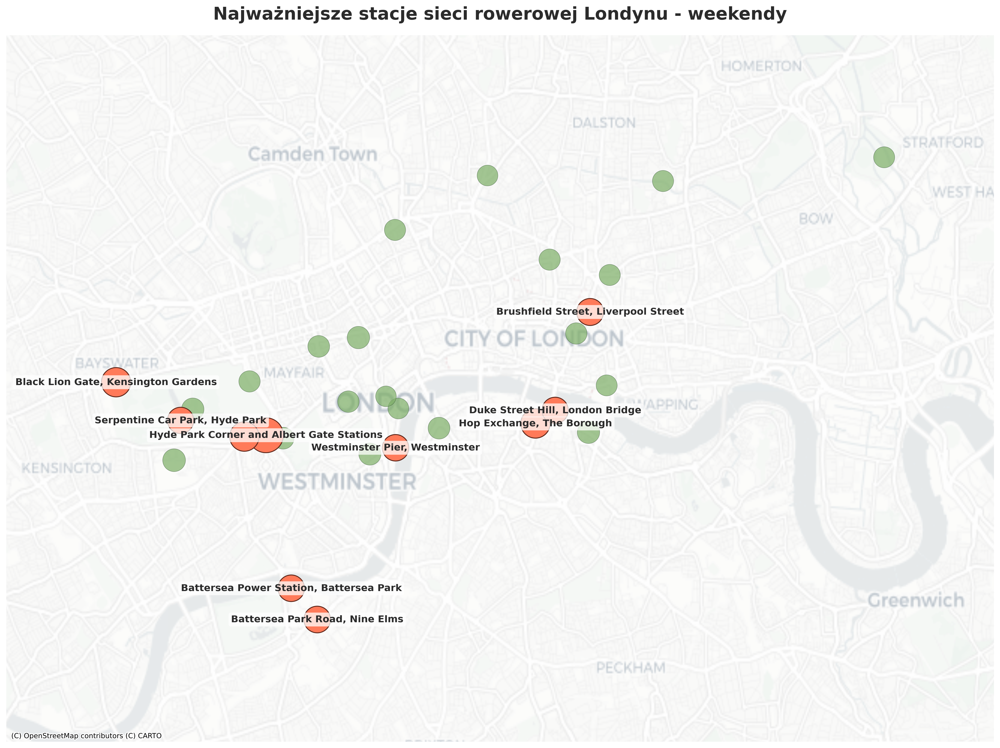

In [107]:
# ---------- Top 30 stations ----------

top_30_weekend_indices = sorted_indices[:30]

top_30_weekend_names = []

for idx in top_30_weekend_indices:

    station_id = index_to_station[idx]

    station_name = stations_weekends_df[
        stations_weekends_df["station_id"] == station_id
    ]["station_name"].values[0]

    top_30_weekend_names.append(station_name)


# ---------- Top 10 stations ----------

top_10_weekend_names = []

for idx in top_10_weekend_stations:

    station_id = index_to_station[idx]

    station_name = stations_weekends_df[
        stations_weekends_df["station_id"] == station_id
    ]["station_name"].values[0]

    top_10_weekend_names.append(station_name)


# ---------- Filtering strongest edges ----------

min_weight = 400

filtered_edges_df = edges_weekends_df[
    (edges_weekends_df["start_station_name"] != edges_weekends_df["end_station_name"]) &
    (edges_weekends_df["weight"] >= min_weight)
].copy()


# ---------- Building filtered graph ----------

filtered_graph = nx.from_pandas_edgelist(
    filtered_edges_df,
    source="start_station_name",
    target="end_station_name",
    edge_attr="weight",
    create_using=nx.DiGraph()
)


# ---------- GeoDataFrame ----------

stations_weekends_df["lat"] = stations_weekends_df["lat"].astype(float)
stations_weekends_df["lon"] = stations_weekends_df["lon"].astype(float)

geo_df = gpd.GeoDataFrame(
    stations_weekends_df,
    geometry=gpd.points_from_xy(
        stations_weekends_df["lon"],
        stations_weekends_df["lat"]
    ),
    crs="EPSG:4326"
)

geo_df = geo_df.to_crs(epsg=3857)


# ---------- Positions in EPSG:3857 ----------

positions_3857 = {}

for _, row in geo_df.iterrows():

    positions_3857[row["station_name"]] = (
        row.geometry.x,
        row.geometry.y
    )


# ---------- Stationary distribution dictionary ----------

stationary_dict = {}

for idx, probability in enumerate(stationary_distribution[0]):

    station_id = index_to_station[idx]

    station_name = stations_weekends_df[
        stations_weekends_df["station_id"] == station_id
    ]["station_name"].values[0]

    stationary_dict[station_name] = probability


# ---------- Node sizes proportional to stationary distribution ----------

top_30_node_sizes = [
    200 + 120000 * stationary_dict[node]
    for node in top_30_weekend_names
]

top_10_node_sizes = [
    300 + 150000 * stationary_dict[node]
    for node in top_10_weekend_names
]


# ---------- Labels ----------

labels_to_skip = [
    "Waterloo Station 1, Waterloo",
    "Albert Gate, Hyde Park"
]


labels = {}

for node in top_10_weekend_names:

    if node in labels_to_skip:
        continue

    elif node == "Waterloo Station 3, Waterloo":
        labels[node] = "Waterloo Stations"
    elif node == "Hyde Park Corner, Hyde Park":
        labels[node] = "Hyde Park Corner and Albert Gate Stations"
    else:
        labels[node] = node


# ---------- Plot style ----------

plt.rcParams["font.family"] = "DejaVu Sans"
plt.rcParams["axes.titlesize"] = 20
plt.rcParams["axes.titleweight"] = "bold"


# ---------- Drawing ----------

fig, ax = plt.subplots(figsize=(16, 12), dpi=250)


# Top 30 stations

nx.draw_networkx_nodes(
    filtered_graph,
    positions_3857,
    nodelist=top_30_weekend_names,
    node_size=top_30_node_sizes,
    node_color="#7FB069",
    alpha=0.72,
    edgecolors="#2F4F2F",
    linewidths=0.35,
    ax=ax
)


# Top 10 stations highlighted

nx.draw_networkx_nodes(
    filtered_graph,
    positions_3857,
    nodelist=top_10_weekend_names,
    node_size=top_10_node_sizes,
    node_color="#FF7A59",
    alpha=1.0,
    edgecolors="#5A2418",
    linewidths=1.0,
    ax=ax
)


# Labels for selected top 10 stations

text_items = nx.draw_networkx_labels(
    filtered_graph,
    positions_3857,
    labels=labels,
    font_size=11,
    font_weight="bold",
    font_color="#2b2b2b",
    font_family="DejaVu Sans",
    ax=ax
)

for _, text in text_items.items():

    text.set_bbox(
        dict(
            facecolor="white",
            edgecolor="none",
            alpha=0.75,
            boxstyle="round,pad=0.25"
        )
    )


# ---------- Map extent ----------

x_values = [
    positions_3857[node][0]
    for node in top_30_weekend_names
]

y_values = [
    positions_3857[node][1]
    for node in top_30_weekend_names
]

ax.set_xlim(
    min(x_values) - padding,
    max(x_values) + padding
)

ax.set_ylim(
    min(y_values) - padding,
    max(y_values) + padding
)


# ---------- Basemap ----------

ctx.add_basemap(
    ax,
    source=ctx.providers.CartoDB.Positron
)

for image in ax.get_images():
    image.set_alpha(0.58)


# ---------- Title ----------

ax.set_title(
    "Najważniejsze stacje sieci rowerowej Londynu - weekendy",
    color="#2b2b2b",
    pad=18
)

plt.axis("off")
plt.tight_layout()
plt.show()

## Weekdays network

In [108]:
start_stations_weekdays_df = trip_data[
    [
        "start_station_id",
        "start_station_name",
        "start_lat",
        "start_lon",
    ]
].drop_duplicates()

start_stations_weekdays_df = start_stations_weekdays_df.rename(columns={
    "start_station_id": "station_id",
    "start_station_name": "station_name",
    "start_lat": "lat",
    "start_lon": "lon"
})

start_stations_weekdays_df.head()

,station_id,station_name,lat,lon
0,1108,"North Wharf Road, Paddington",51.518623,-0.17660300000000007
1,3447,"Gloucester Road (North), Kensington",51.49792478,-0.183834706
2,1090,"Warren Street Station, Euston",51.52443845,-0.138019439
3,200058,"Northdown Street, King's Cross",51.531066,-0.11934
4,1052,"Soho Square , Soho",51.51563144,-0.132328837


In [109]:
end_stations_weekdays_df = trip_data[
    [
        "end_station_id",
        "end_station_name",
        "end_lat",
        "end_lon",
    ]
].drop_duplicates()

end_stations_weekdays_df = end_stations_weekdays_df.rename(columns={
    "end_station_id": "station_id",
    "end_station_name": "station_name",
    "end_lat": "lat",
    "end_lon": "lon"
})

end_stations_weekdays_df.head()

,station_id,station_name,lat,lon
0,3423.0,"Maida Vale, Maida Vale",51.529857,-0.18348604
1,1214.0,"Kensington Olympia Station, Olympia",51.49815779,-0.209494128
2,200005.0,"New Cavendish Street, Marylebone",51.519167,-0.147983
3,2687.0,"Brick Lane Market, Shoreditch",51.52261762,-0.071653961
4,1150.0,"Queensway, Kensington Gardens",51.51031,-0.18740235


In [110]:
stations_weekdays_df = pd.concat([start_stations_weekdays_df, end_stations_weekdays_df], ignore_index=True).drop_duplicates()
print("Number of stations:", len(stations_weekdays_df))

Number of stations: 801


In [111]:
edges_weekdays_df = trip_data_weekdays.groupby(
    [
        "start_station_id",
        "start_station_name",
        "end_station_id",
        "end_station_name"
    ]
).agg(
    weight=("start_station_id", "count")
).reset_index()

In [112]:
graph_weekdays = nx.from_pandas_edgelist(
    edges_weekdays_df,
    source="start_station_name",
    target="end_station_name",
    edge_attr="weight",
    create_using=nx.DiGraph()
)
    
positions = {}

stations_weekdays_df["lat"] = stations_weekdays_df["lat"].astype(float)
stations_weekdays_df["lon"] = stations_weekdays_df["lon"].astype(float)

for _, row in stations_weekdays_df.iterrows():

    positions[row["station_name"]] = (
        row["lon"],
        row["lat"]
    )

## Weekdays Markov

In [113]:
positions = {}

for _, row in stations_weekdays_df.iterrows():

    positions[row["station_name"]] = (
        row["lon"],
        row["lat"]
    )

station_to_index = {
    station_id: idx
    for idx, station_id in enumerate(
        sorted(stations_weekdays_df["station_id"].unique())
    )
}

index_to_station = {
    idx: station_id
    for station_id, idx in station_to_index.items()
}

In [114]:
N = len(stations_weekdays_df["station_id"].unique())

wij_matrix = np.zeros((N, N))


for _, row in edges_weekdays_df.iterrows():

        start_station = row["start_station_id"]
        end_station = row["end_station_id"]
        weight = row["weight"]

        i = station_to_index[start_station]
        j = station_to_index[end_station]


        wij_matrix[i][j] = weight

In [115]:
wik_sum = wij_matrix.sum(axis=1)
wik_sum = wik_sum.reshape((-1, 1))

In [116]:
Pij_matrix = wij_matrix / wik_sum
Pij_matrix.sum(axis=1)

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1.

In [117]:
p_t0_matrix = np.zeros((1, N))
p_t0_matrix[0, :] = 1/N
print(p_t0_matrix)

[[0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.

In [118]:
p_t1_matrix = np.zeros((1, N))

diff = abs(p_t1_matrix - p_t0_matrix). sum()
iteration = 0

while diff > 1e-10:
    p_t1_matrix = p_t0_matrix @ Pij_matrix
    diff = abs(p_t1_matrix - p_t0_matrix). sum()
    p_t0_matrix = p_t1_matrix
    iteration += 1

print(iteration)

stationary_distribution = p_t1_matrix


76


In [119]:
sorted_weekdays_indices = np.argsort(stationary_distribution[0])[::-1]
sorted_weekdays_probs = stationary_distribution[0][sorted_weekdays_indices]

top_10_weekdays_stations = sorted_weekdays_indices[:10]
top_10_weekdays_probs = sorted_weekdays_probs[:10]

print("--- Top 10 stations on weekdays: ---")

for idx, prob in zip(top_10_weekdays_stations, top_10_weekdays_probs):

    station_id = index_to_station[idx]

    station_name = stations_weekdays_df[stations_weekdays_df["station_id"] == station_id]["station_name"].values[0]

    print(station_name)
    

--- Top 10 stations on weekdays: ---
Waterloo Station 3, Waterloo
Waterloo Station 1, Waterloo
Hyde Park Corner, Hyde Park
Wormwood Street, Liverpool Street
Hop Exchange, The Borough
Brushfield Street, Liverpool Street
St. James's Square, St. James's
Argyle Street, Kings Cross
Queen Street 1, Bank
Duke Street Hill, London Bridge


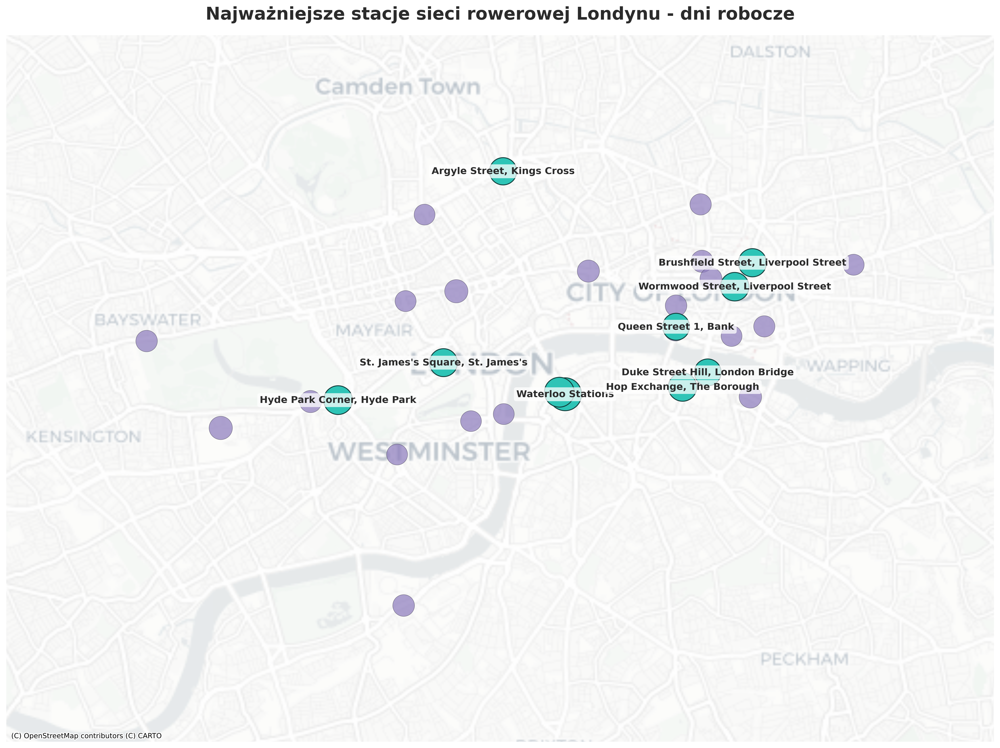

In [ ]:
# ---------- Top 30 stations ----------

top_30_weekdays_indices = sorted_weekdays_indices[:30]

top_30_weekdays_names = []

for idx in top_30_weekdays_indices:

    station_id = index_to_station[idx]

    station_name = stations_weekdays_df[
        stations_weekdays_df["station_id"] == station_id
    ]["station_name"].values[0]

    top_30_weekdays_names.append(station_name)


# ---------- Top 10 stations ----------

top_10_weekdays_names = []

for idx in top_10_weekdays_stations:

    station_id = index_to_station[idx]

    station_name = stations_weekdays_df[
        stations_weekdays_df["station_id"] == station_id
    ]["station_name"].values[0]

    top_10_weekdays_names.append(station_name)


# ---------- Filtering strongest edges ----------

min_weight = 400

filtered_edges_df = edges_weekdays_df[
    (edges_weekdays_df["start_station_name"] != edges_weekdays_df["end_station_name"]) &
    (edges_weekdays_df["weight"] >= min_weight)
].copy()


# ---------- Building filtered graph ----------

filtered_graph = nx.from_pandas_edgelist(
    filtered_edges_df,
    source="start_station_name",
    target="end_station_name",
    edge_attr="weight",
    create_using=nx.DiGraph()
)


# ---------- GeoDataFrame ----------

stations_weekdays_df["lat"] = stations_weekdays_df["lat"].astype(float)
stations_weekdays_df["lon"] = stations_weekdays_df["lon"].astype(float)

geo_df = gpd.GeoDataFrame(
    stations_weekdays_df,
    geometry=gpd.points_from_xy(
        stations_weekdays_df["lon"],
        stations_weekdays_df["lat"]
    ),
    crs="EPSG:4326"
)

geo_df = geo_df.to_crs(epsg=3857)


# ---------- Positions in EPSG:3857 ----------

positions_3857 = {}

for _, row in geo_df.iterrows():

    positions_3857[row["station_name"]] = (
        row.geometry.x,
        row.geometry.y
    )


# ---------- Stationary distribution dictionary ----------

stationary_dict = {}

for idx, probability in enumerate(stationary_distribution[0]):

    station_id = index_to_station[idx]

    station_name = stations_weekdays_df[
        stations_weekdays_df["station_id"] == station_id
    ]["station_name"].values[0]

    stationary_dict[station_name] = probability


# ---------- Node sizes proportional to stationary distribution ----------

top_30_node_sizes = [
    200 + 120000 * stationary_dict[node]
    for node in top_30_weekdays_names
]

top_10_node_sizes = [
    300 + 150000 * stationary_dict[node]
    for node in top_10_weekdays_names
]


# ---------- Labels ----------

labels_to_skip = [
    "Waterloo Station 1, Waterloo",
]

labels = {}

for node in top_10_weekdays_names:

    if node in labels_to_skip:
        continue

    elif node == "Waterloo Station 3, Waterloo":
        labels[node] = "Waterloo Stations"

    else:
        labels[node] = node


# ---------- Plot style ----------

plt.rcParams["font.family"] = "DejaVu Sans"
plt.rcParams["axes.titlesize"] = 20
plt.rcParams["axes.titleweight"] = "bold"


# ---------- Drawing ----------

fig, ax = plt.subplots(figsize=(16, 12), dpi=250)


# Top 30 stations

nx.draw_networkx_nodes(
    filtered_graph,
    positions_3857,
    nodelist=top_30_weekdays_names,
    node_size=top_30_node_sizes,
    node_color="#8E7DBE",
    alpha=0.72,
    edgecolors="#2E2A3B",
    linewidths=0.35,
    ax=ax
)


# Top 10 stations highlighted

nx.draw_networkx_nodes(
    filtered_graph,
    positions_3857,
    nodelist=top_10_weekdays_names,
    node_size=top_10_node_sizes,
    node_color="#2EC4B6",
    alpha=1.0,
    edgecolors="#123C3A",
    linewidths=1.0,
    ax=ax
)


# Labels for selected top 10 stations

text_items = nx.draw_networkx_labels(
    filtered_graph,
    positions_3857,
    labels=labels,
    font_size=11,
    font_weight="bold",
    font_color="#2b2b2b",
    font_family="DejaVu Sans",
    ax=ax
)

for _, text in text_items.items():

    text.set_bbox(
        dict(
            facecolor="white",
            edgecolor="none",
            alpha=0.75,
            boxstyle="round,pad=0.25"
        )
    )


# ---------- Map extent ----------

x_values = [
    positions_3857[node][0]
    for node in top_30_weekdays_names
]

y_values = [
    positions_3857[node][1]
    for node in top_30_weekdays_names
]

ax.set_xlim(
    min(x_values) - padding,
    max(x_values) + padding
)

ax.set_ylim(
    min(y_values) - padding,
    max(y_values) + padding
)


# ---------- Basemap ----------

ctx.add_basemap(
    ax,
    source=ctx.providers.CartoDB.Positron
)

for image in ax.get_images():
    image.set_alpha(0.58)


# ---------- Title ----------

ax.set_title(
    "Najważniejsze stacje sieci rowerowej Londynu - dni robocze",
    color="#2b2b2b",
    pad=18
)

plt.axis("off")
plt.tight_layout()
plt.show()

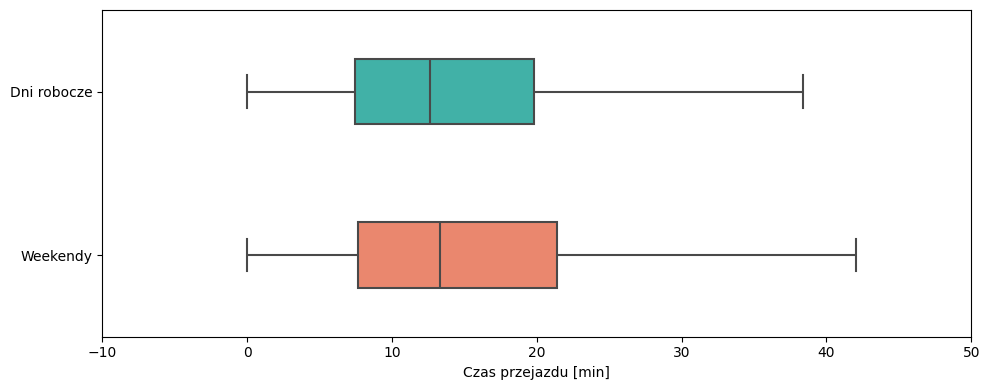

In [144]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# ---------- Duration in minutes ----------

trip_data_weekdays = trip_data_weekdays.copy()
trip_data_weekends = trip_data_weekends.copy()

trip_data_weekdays["duration_min"] = (
    trip_data_weekdays["total_duration_ms"] / 1000 / 60
)

trip_data_weekends["duration_min"] = (
    trip_data_weekends["total_duration_ms"] / 1000 / 60
)

trip_data_weekdays["day_type"] = "Dni robocze"
trip_data_weekends["day_type"] = "Weekendy"


# ---------- Combine data ----------

duration_data = pd.concat(
    [
        trip_data_weekdays[["duration_min", "day_type"]],
        trip_data_weekends[["duration_min", "day_type"]]
    ],
    ignore_index=True
)


# ---------- Optional filtering for readability ----------

duration_data_plot = duration_data[
    duration_data["duration_min"] <= 50
]


# ---------- Boxplot ----------

plt.figure(figsize=(10, 4))

sns.boxplot(
    data=duration_data_plot,
    x="duration_min",
    y="day_type",
    hue="day_type",
    showfliers=False,
    width=0.4,
    linewidth=1.5,
    palette={
        "Dni robocze": "#2EC4B6",
        "Weekendy": "#FF7A59"
    },
    legend=False
)

plt.xlabel("Czas przejazdu [min]")
plt.ylabel("")

plt.xlim(-10, 50)

plt.tight_layout()

plt.show()

In [141]:
# ---------- Function for boxplot statistics ----------

def boxplot_statistics(data):

    q1 = data.quantile(0.25)
    q3 = data.quantile(0.75)

    iqr = q3 - q1

    lower_limit = q1 - 1.5 * iqr
    upper_limit = q3 + 1.5 * iqr

    lower_whisker = data[data >= lower_limit].min()
    upper_whisker = data[data <= upper_limit].max()

    return pd.Series({
        "Lower whisker": lower_whisker,
        "Q1 (25%)": q1,
        "Mediana": data.median(),
        "Q3 (75%)": q3,
        "Upper whisker": upper_whisker,
        "Średnia": data.mean(),
        "Odchylenie std": data.std()
    })


# ---------- Table ----------

boxplot_stats_table = pd.DataFrame({
    "Dni robocze": boxplot_statistics(
        trip_data_weekdays["duration_min"]
    ),

    "Weekend": boxplot_statistics(
        trip_data_weekends["duration_min"]
    )
})

boxplot_stats_table = boxplot_stats_table.round(2)

print(boxplot_stats_table)

                Dni robocze  Weekend
Lower whisker          0.00     0.01
Q1 (25%)               7.61     7.89
Mediana               12.92    13.91
Q3 (75%)              20.65    22.98
Upper whisker         40.20    45.63
Średnia               21.78    26.99
Odchylenie std       415.00   524.69
